<a href="https://colab.research.google.com/github/minoclod/Procesamiento-de-Imagen/blob/master/Clase3.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **PRIMER CORTE**


In [1]:
from google.colab import drive
drive.mount('/content/drive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/drive


In [2]:
#importar librerias necesarias
import numpy as np    # importo la libreria numpy con el nombre np. sirve para hacer calculos matriciales, arreglos.
import matplotlib.pyplot as plt  #libreria para hacer dibujos
import cv2 #libreria que se usa para procesar imagene, libreria de open cb para pytom
import os
import torch

path='/content/drive/My Drive/Procesamiento de imagen/IMAGENES/'
os.chdir(path)
!pwd



#graficar imagenes estaticas en el notebook
%matplotlib inline  
# %matplotlib es para que nos deje ver todo en linea. 

/content/drive/My Drive/Procesamiento de imagen/IMAGENES


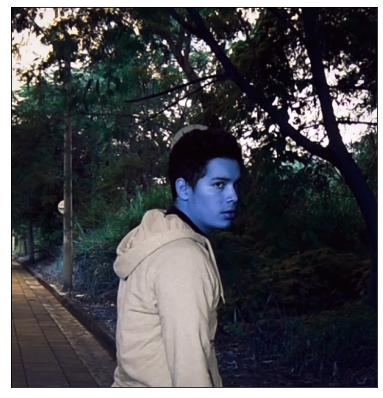

In [0]:
#CARGAR IMAGEN
#leer imagen
# cuando leo img en opencv la lee bgr entonces invierte los colores 
img_BGR=cv2.imread('/content/drive/My Drive/Bloqueo-(0;00;10;37).jpg', cv2.IMREAD_COLOR)

plt.figure(figsize=(7,7))  #creo el figure, los 7 no tiene nada que ver con tamaño o resolucion
plt.imshow(img_BGR) #entrego la imagen
plt.xticks([]) #sirve para quitar los numeros alrededor de la imagen.
plt.yticks([])#sirve para quitar los numeros alrededor de la imagen.

plt.show()  #muestra la imagen 

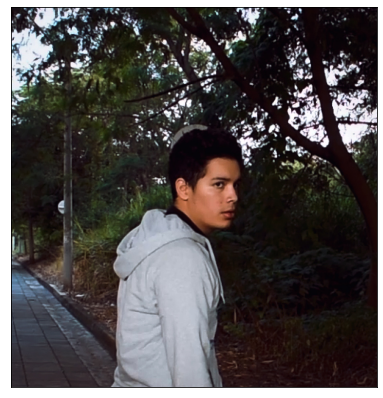

In [0]:
#CARGAR IMAGEN
#leer imagen
# PASAR IMAGEN A RGB
img_RGB=cv2.cvtColor(img_BGR, cv2.COLOR_BGR2RGB)

plt.figure(figsize=(7,7))  #creo el figure, los 7 no tiene nada que ver con tamaño o resolucion
plt.imshow(img_RGB) #entrego la imagen
plt.xticks([]) #sirve para quitar los numeros alrededor de la imagen.
plt.yticks([])#sirve para quitar los numeros alrededor de la imagen.

plt.show()  #muestra la imagen 

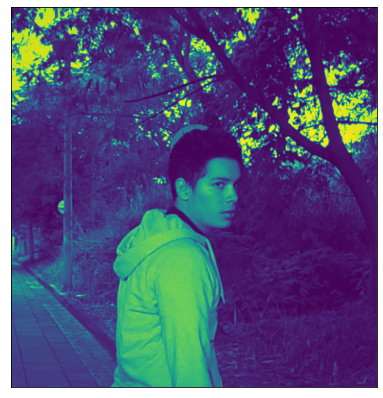

In [0]:
#CARGAR IMAGEN
#leer imagen
# PASAR IMAGEN A GRIS
img_GRAY=cv2.cvtColor(img_BGR, cv2.COLOR_BGR2GRAY)

plt.figure(figsize=(7,7))  #creo el figure, los 7 no tiene nada que ver con tamaño o resolucion
plt.imshow(img_GRAY) #entrego la imagen
plt.xticks([]) #sirve para quitar los numeros alrededor de la imagen.
plt.yticks([])#sirve para quitar los numeros alrededor de la imagen.

plt.show()  #muestra la imagen 

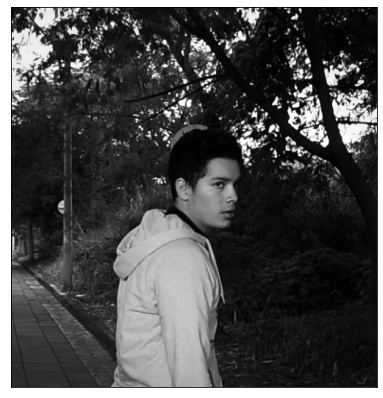

In [0]:
#MAPEAR A GRIS PARA QUE SE VEA GRIS

plt.figure(figsize=(7,7))  #creo el figure, los 7 no tiene nada que ver con tamaño o resolucion
plt.imshow(img_GRAY, cmap='gray') #entrego la imagen
plt.xticks([]) #sirve para quitar los numeros alrededor de la imagen.
plt.yticks([])#sirve para quitar los numeros alrededor de la imagen.

plt.show()  #muestra la imagen 

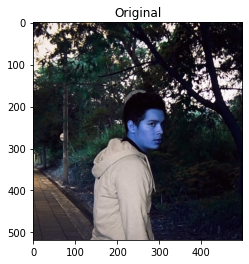

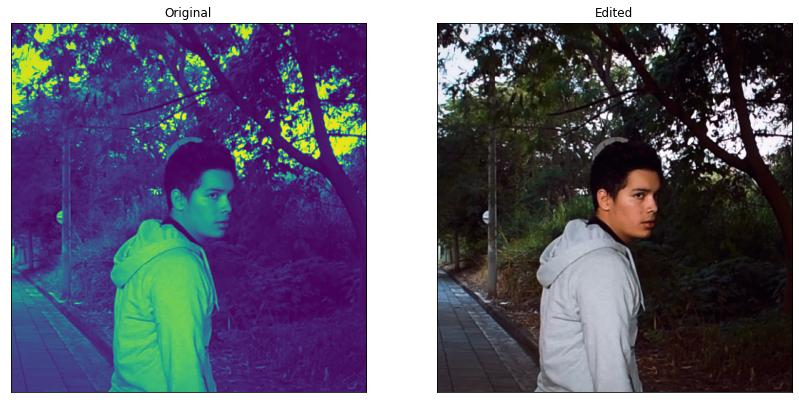

In [0]:
# DISPLAY TWO IMAGES

def display(a,b, title1= "Original",title2= "Edited"):

    plt.figure(figsize=(14,14))
    plt.subplot(121), plt.imshow(a),plt.title(title1)
    plt.xticks([]), plt.yticks([])
    plt.subplot(122), plt.imshow(b), plt.title(title2)
    plt.xticks([]), plt.yticks([])
    plt.show()

#DISPLAY ONE IMAGE

def display_one(a,title1= "Original"):
    plt.imshow(a), plt.title(title1)
    plt.show()

display_one(img_BGR)
display(img_GRAY,img_RGB)

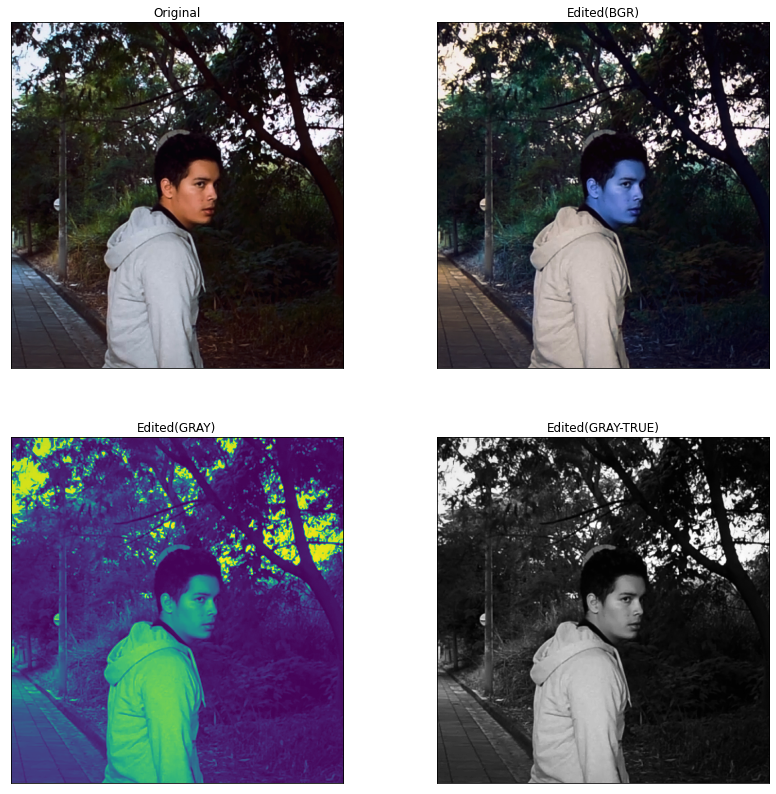

In [0]:
#DISPLAY FOUR IMAGES

def display_four(a,b,c,d, title1= "Original",title2= "Edited(BGR)", title3= "Edited(GRAY)", title4= "Edited(GRAY-TRUE)"):

    plt.figure(figsize=(14,14))
    plt.subplot(221), plt.imshow(a),plt.title(title1)
    plt.xticks([]), plt.yticks([])
    plt.subplot(222), plt.imshow(b), plt.title(title2)
    plt.xticks([]), plt.yticks([])
    plt.subplot(223), plt.imshow(c),plt.title(title3)
    plt.xticks([]), plt.yticks([])
    plt.subplot(224), plt.imshow(d,cmap='gray'), plt.title(title4)
    plt.xticks([]), plt.yticks([])

    plt.show()

display_four(img_RGB, img_BGR, img_GRAY, img_GRAY)

In [0]:
#CANALES

def estadisticas(img):

  img_size=img.shape

  if len(img_size)>2:
      print("image channels", img_size[2])
  else:
      print("image channels",1)

  print("image W",img_size[1]) #ancho
  print("image H",img_size[0]) #alto
  print("min value", img.min()) #valor min en la matriz
  print("max value", img.max()) #valor max en la matriz
  print("prom",img.mean()) #promedio de los valores en la matriz
  print("type", img.dtype) # tipo de la imagen ejemplo: 8 bit, 16 bit...

estadisticas(img_BGR)

image channels 3
image W 498
image H 518
min value 0
max value 255
prom 61.46189390767704
type uint8


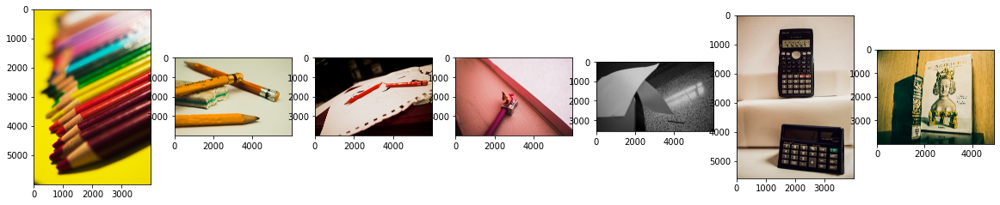

In [0]:
images = []    #una lista llamada imagen
IMAGE_DIRECTORY='/content/drive/My Drive/pecados/'

def get_image(image_path):
    image = cv2.imread(image_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    return image

for file in os.listdir(IMAGE_DIRECTORY):
    if not file.startswith('.'):
        images.append(get_image(os.path.join(IMAGE_DIRECTORY, file))) #append es para añadir cosas a lista, inserta en cada iteracion del for, os.path.join esta uniendo la ruta

plt.figure(figsize=(20, 10))
for i in range(len(images)):
    plt.subplot(1, len(images), i+1) #por cada itercion va hacer un plot 
    plt.imshow(images[i])


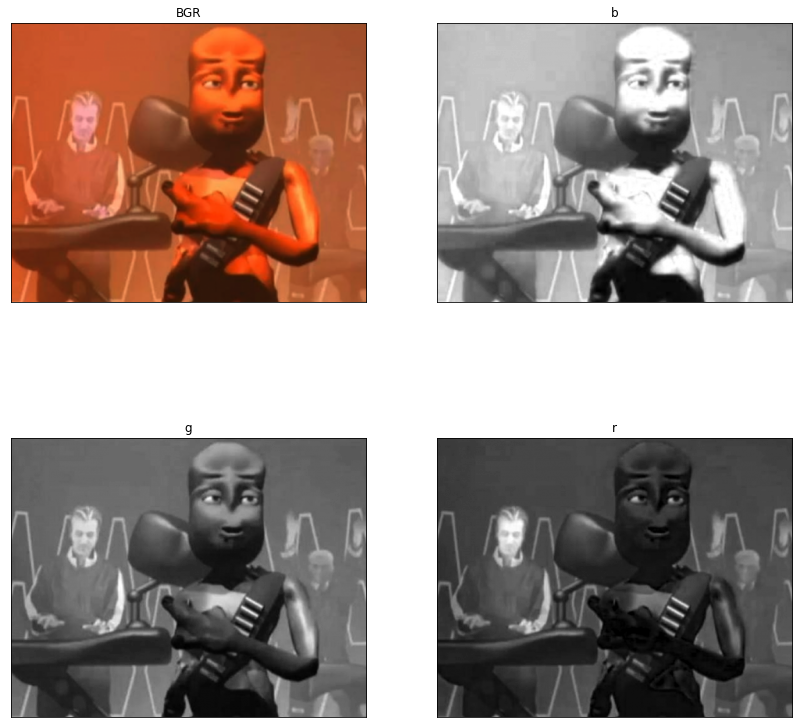

In [0]:
#DE COLOR A BLANCO Y NEGRO POR MEDIO DE MATRICES.

img_BGR=cv2.imread('/content/drive/My Drive/Procesamiento de imagen/IMAGENES/unnamed.png', cv2.IMREAD_COLOR)

b= img_BGR[:,:,0]  # : significa toda las filas y todas las columnas del canal cero 
g= img_BGR[:,:,1]   #  los dos puntos sin nada es para que me traiga todo
r= img_BGR[:,:,2]

def display_four(img_BGR,b,g,r, title1= "BGR",title2= "B", title3= "G", title4= "R"):



    plt.figure(figsize=(14,14))
    plt.subplot(221), plt.imshow(img_BGR),plt.title(title1)
    plt.xticks([]), plt.yticks([])
    plt.subplot(222), plt.imshow(b,cmap='gray'), plt.title(title2)
    plt.xticks([]), plt.yticks([])
    plt.subplot(223), plt.imshow(g,cmap='gray'),plt.title(title3)
    plt.xticks([]), plt.yticks([])
    plt.subplot(224), plt.imshow(r,cmap='gray'), plt.title(title4)
    plt.xticks([]), plt.yticks([])

    plt.show()

display_four(img_BGR, b, g, r,"BGR", "b", "g", "r")






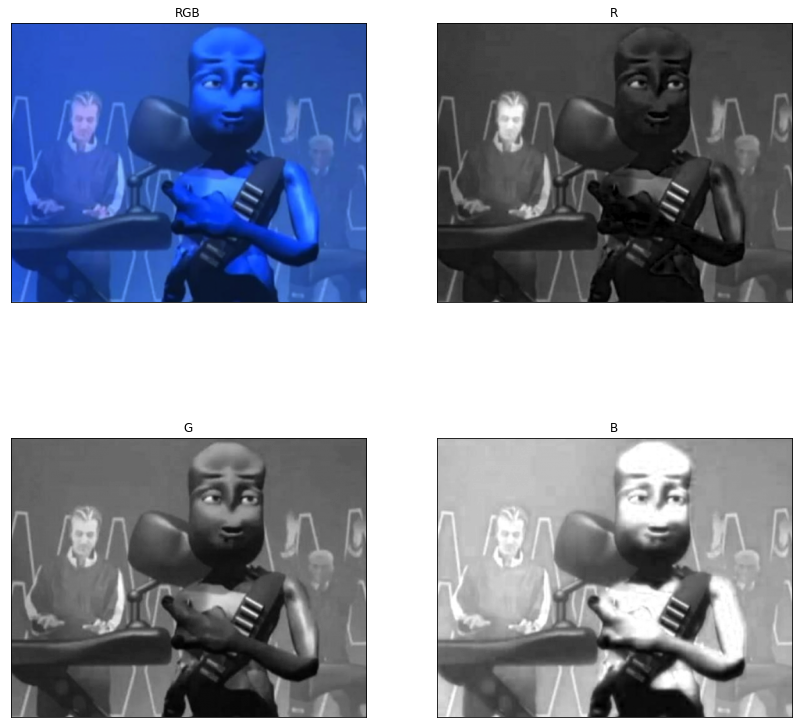

In [0]:
#DE COLOR A RGB POR MEDIO DE MATRICES.

img_RGB=cv2.cvtColor(img_BGR, cv2.COLOR_BGR2RGB)
r,g,b= cv2.split(img_RGB)

display_four(img_RGB, r, g, b,"RGB", "R", "G", "B")

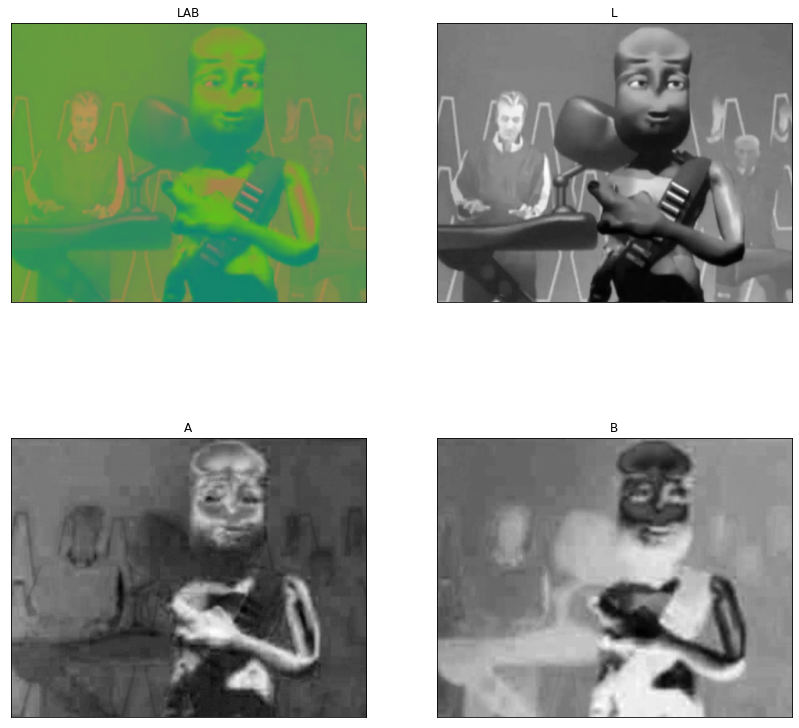

In [0]:
#LAB COLOR-SPACE

img_LAB=cv2.cvtColor(img_BGR, cv2.COLOR_BGR2LAB)
L,A,B= cv2.split(img_LAB)
display_four(img_LAB,L,A,B,"LAB","L","A","B")

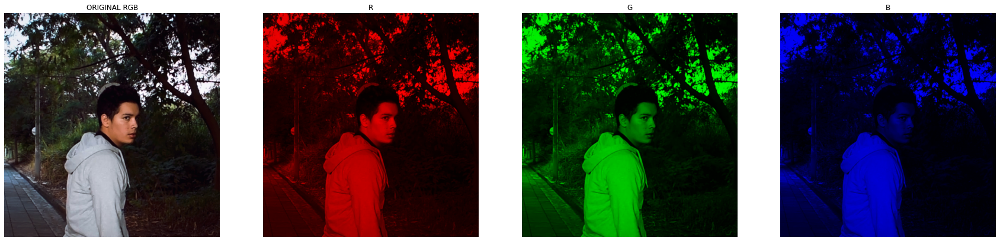

In [0]:
#COLORES

count= 2
plt.figure(figsize=(30,30))
plt.subplot(1,4,1), plt.imshow(img_RGB/255.0),plt.title("ORIGINAL RGB")
plt.axis("off")
for i, lab in enumerate(["R","G","B"]):
  crgb= np.zeros(img_RGB.shape)
  crgb[:,:,i]=img_RGB[:,:,i]
  plt.subplot(1,4,count), plt.imshow(crgb/255.0), plt.title(lab)
  plt.axis("off")
  count +=1


In [0]:
#ESPECTRO LAB


from skimage.color import rgb2lab, lab2rgb

def one_chanel_LAB_convert_to_RGB(image,idim):
  '''
  image is a single lab image of shape(None,None,3)
  '''

  z= np.zeros(image.shape)
  if idim !=0:
    z[:,:,0]=20 ## I need yo brightness to plot the image along 1st or 2nd axis
  z[:,:,idim]= image[:,:,idim]
  z= lab2rgb(z)
  return(z)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


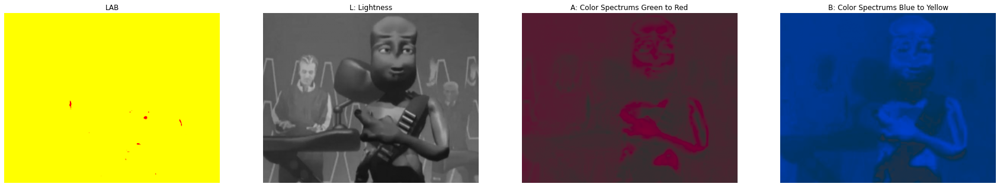

In [0]:
img_LAB=cv2.cvtColor(img_BGR,cv2.COLOR_BGR2RGB)
img_LAB=rgb2lab(img_LAB)

count = 1
plt.figure(figsize=(30,30))

plt.subplot(1,4,1)
plt.imshow(img_LAB), plt.title("LAB"), plt.axis("off")

plt.subplot(1,4,2)
lab_rgb_gray= one_chanel_LAB_convert_to_RGB(img_LAB,0)
plt.imshow(lab_rgb_gray), plt.title("L: Lightness"), plt.axis("off")

plt.subplot(1,4,3)
lab_rgb_gray= one_chanel_LAB_convert_to_RGB(img_LAB,1)
plt.imshow(lab_rgb_gray), plt.title("A: Color Spectrums Green to Red"), plt.axis("off")

plt.subplot(1,4,4)
lab_rgb_gray= one_chanel_LAB_convert_to_RGB(img_LAB,2)
plt.imshow(lab_rgb_gray), plt.title("B: Color Spectrums Blue to Yellow"), plt.axis("off")

plt.show()



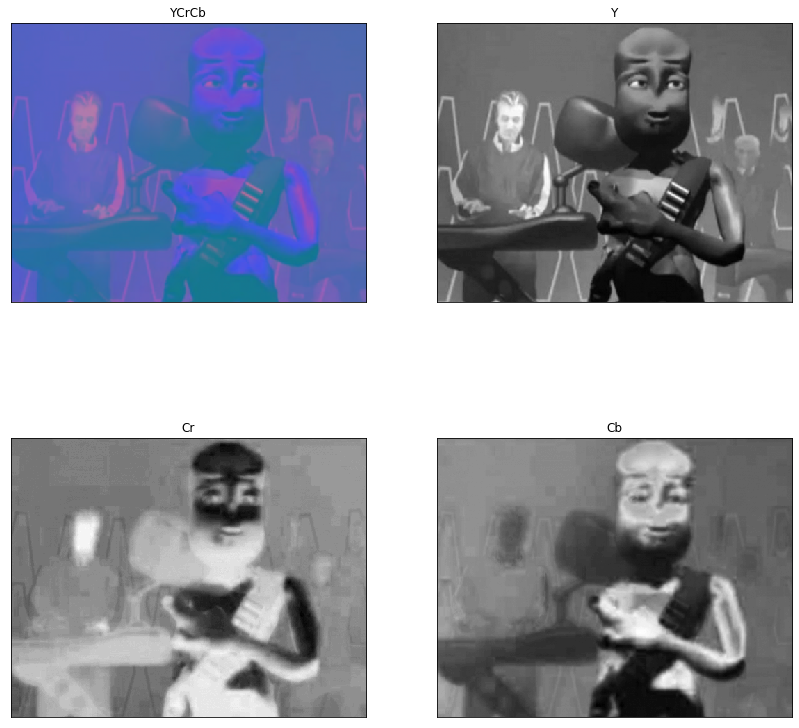

In [0]:
#COLOR YCrCb

img_YCrCb=cv2.cvtColor(img_BGR, cv2.COLOR_BGR2YCrCb)
Y,Cr,Cb= cv2.split(img_YCrCb)
display_four(img_YCrCb,Y,Cr,Cb,"YCrCb","Y","Cr","Cb")

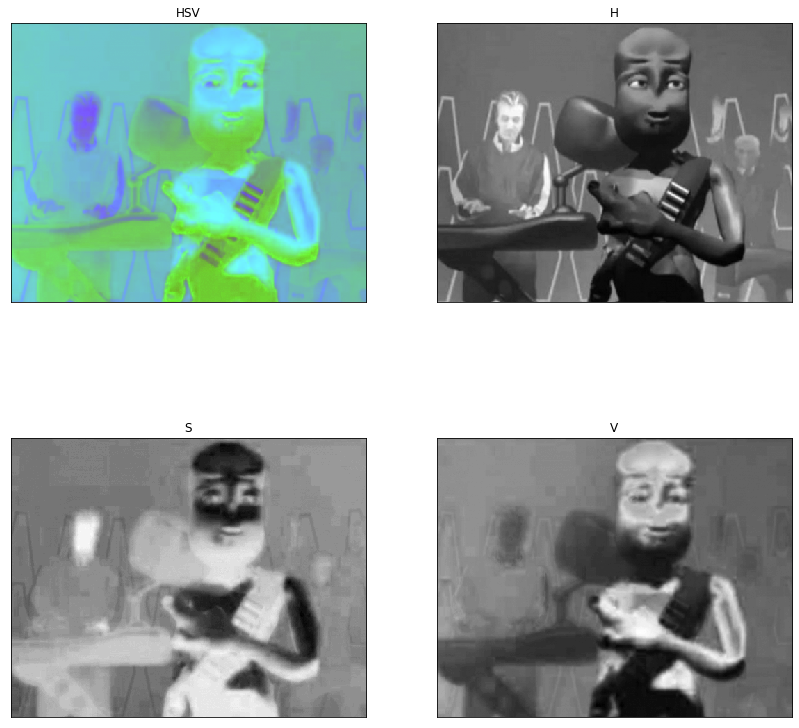

In [0]:
#HSV

img_HSV=cv2.cvtColor(img_BGR, cv2.COLOR_BGR2HSV)
H,S,V= cv2.split(img_HSV)
display_four(img_HSV,Y,Cr,Cb,"HSV","H","S","V")

**INTERPOLACIÓN SEMANA 5**

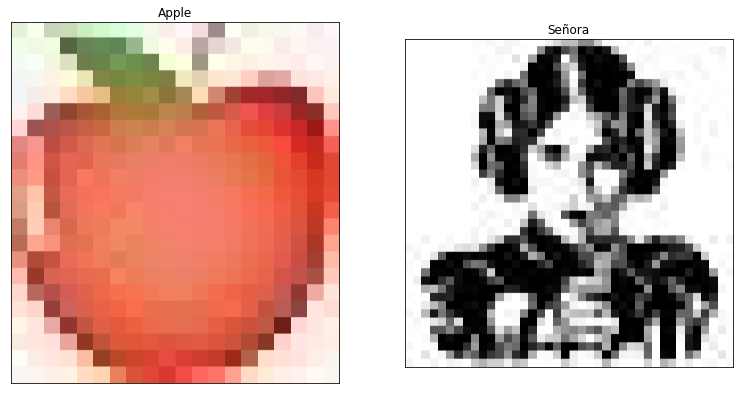

In [0]:

def displayColor2(a,b, title1= "Apple",title2= "Señora"): #METODO PARA PLOTEAR DOS IMAGENES

    plt.figure(figsize=(20,20))
    plt.subplot(131), plt.imshow(a),plt.title(title1)
    plt.xticks([]), plt.yticks([])
    plt.subplot(132), plt.imshow(b), plt.title(title2)
    plt.xticks([]), plt.yticks([])
    plt.show()

def readRGB(imgPath): #Metodo para leer y pasar la imagen de BGR a RGB

      img =cv2.imread(imgPath)
      img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
      return img



plt.show()  #muestra la imagen 


imgA = readRGB('/content/drive/My Drive/Procesamiento de imagen/IMAGENES/apple20x22.jpg')
imgM= readRGB('/content/drive/My Drive/Procesamiento de imagen/IMAGENES/ico.jpg')
near_imgA = cv2.resize(imgA,None, fx = 500, fy = 500, interpolation = cv2.INTER_NEAREST) # None = tamaño , lleva dos datos (Ancho, Alto)
near_imgM = cv2.resize(imgM,None, fx = 500, fy = 500, interpolation = cv2.INTER_NEAREST) # fx y fy = escalamiento.
displayColor2(near_imgA,near_imgM)





**INTERPOLACIÓN BILINEAR**

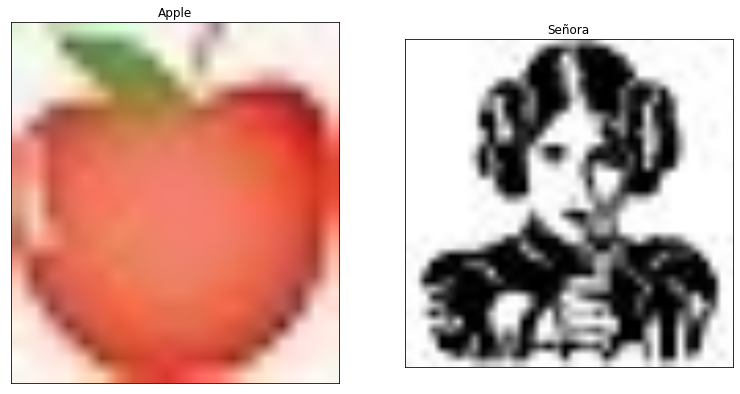

In [0]:

line_imgA = cv2.resize(imgA,None, fx = 50, fy = 50, interpolation = cv2.INTER_LINEAR) # None = tamaño , lleva dos datos (Ancho, Alto)
line_imgM = cv2.resize(imgM,None, fx = 50, fy = 50, interpolation = cv2.INTER_LINEAR) # fx y fy = escalamiento.
displayColor2(line_imgA,line_imgM)

**INTERPOLACIÓN BICUBICO**

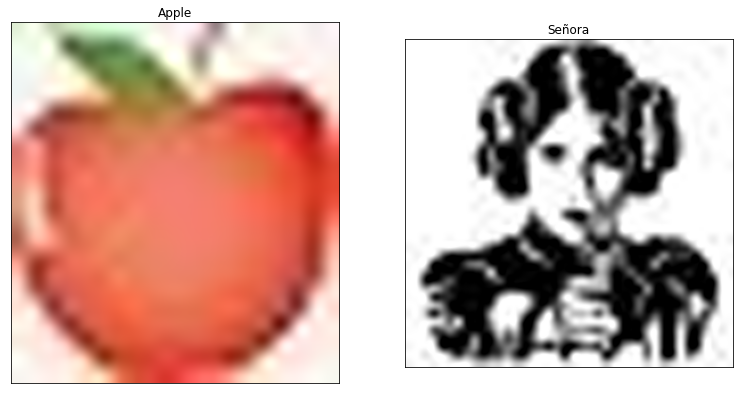

In [0]:

bicu_imgA = cv2.resize(imgA,None, fx = 50, fy = 50, interpolation = cv2.INTER_CUBIC) # None = tamaño , lleva dos datos (Ancho, Alto)
bicu_imgM = cv2.resize(imgM,None, fx = 50, fy = 50, interpolation = cv2.INTER_CUBIC) # fx y fy = escalamiento
displayColor2(bicu_imgA,bicu_imgM)

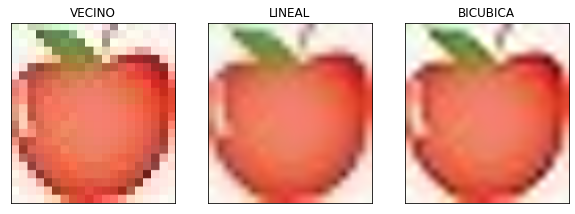

In [0]:
def displayColor3(a,b,d, title1= "VECINO",title2= "LINEAL",title3= "BICUBICA"): #METODO PARA PLOTEAR DOS IMAGENES

    plt.figure(figsize=(10,10))
    plt.subplot(131), plt.imshow(a),plt.title(title1)
    plt.xticks([]), plt.yticks([])
    plt.subplot(132), plt.imshow(b), plt.title(title2)
    plt.xticks([]), plt.yticks([])
    plt.subplot(133), plt.imshow(d), plt.title(title3)
    plt.xticks([]), plt.yticks([])
    plt.show()

displayColor3(near_imgA,line_imgA,bicu_imgA)

**TODAS LAS INTERPOLACIONES**

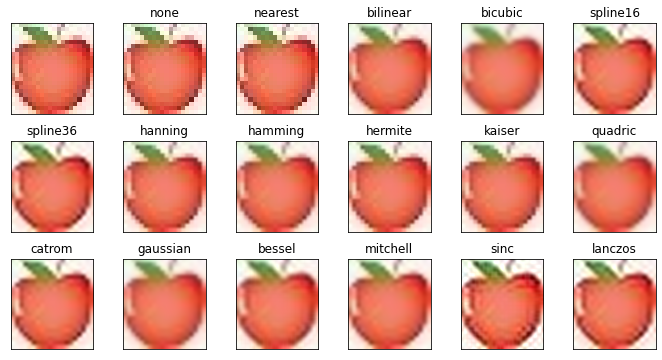

In [0]:
methods= [None, 'none','nearest','bilinear','bicubic','spline16','spline36','hanning','hamming','hermite','kaiser','quadric','catrom','gaussian','bessel','mitchell','sinc','lanczos']

grid=imgA

fig, axes = plt.subplots(3,6, figsize=(12,6), 
                         subplot_kw={'xticks':[], 'yticks':[]})

fig.subplots_adjust(hspace=0.3, wspace=0.05)

for ax, interp_method in zip(axes.flat, methods):
    ax.imshow(grid, interpolation=interp_method)
    ax.set_title(interp_method)

plt.show()    

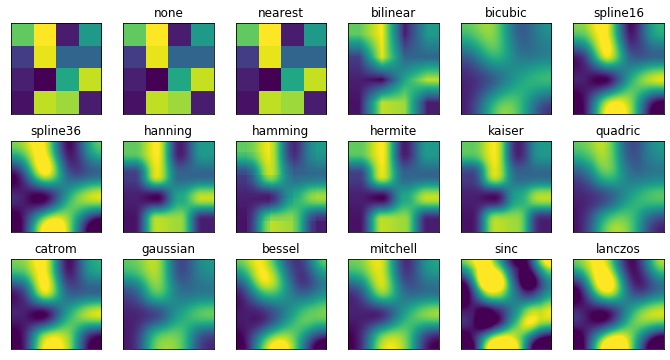

In [0]:
methods= [None, 'none','nearest','bilinear','bicubic','spline16','spline36','hanning','hamming','hermite','kaiser','quadric','catrom','gaussian','bessel','mitchell','sinc','lanczos']

grid= np.random.rand(4,4)
#grid=imgA

fig, axes = plt.subplots(3,6, figsize=(12,6), 
                         subplot_kw={'xticks':[], 'yticks':[]})

fig.subplots_adjust(hspace=0.3, wspace=0.05)

for ax, interp_method in zip(axes.flat, methods):
    ax.imshow(grid, interpolation=interp_method)
    ax.set_title(interp_method)

plt.show()    

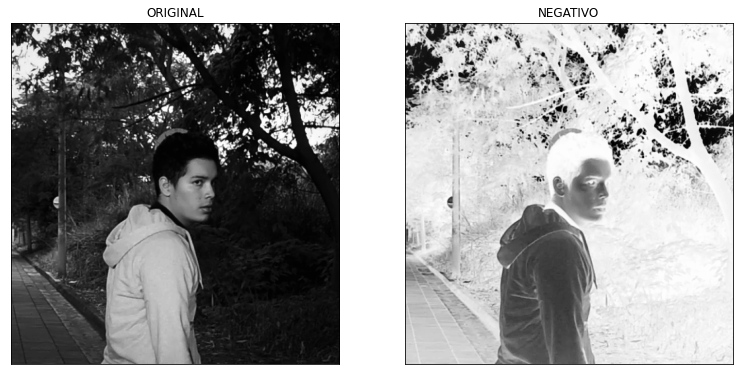

In [0]:
def displayGray2(a,b, title1= "Apple",title2= "Señora"): #METODO PARA PLOTEAR DOS IMAGENES

    plt.figure(figsize=(20,20))
    plt.subplot(131), plt.imshow(a,cmap='gray'),plt.title(title1)
    plt.xticks([]), plt.yticks([])
    plt.subplot(132), plt.imshow(b,cmap='gray'), plt.title(title2)
    plt.xticks([]), plt.yticks([])
    plt.show()

def negative(l):
  #Cargar imagen
  img= cv2.imread("/content/drive/My Drive/Bloqueo-(0;00;10;37) (1).jpg", cv2.IMREAD_GRAYSCALE)
  rows, columns = img.shape
  img2= np.zeros((rows,columns), dtype=np.uint8)
  for x in range(rows):
    for y in range(columns):
      img2[x,y]=(l-1)-img[x,y]

  displayGray2(img,img2,'ORIGINAL','NEGATIVO')
  return

negative(256)

# **SEGUNDO CORTE**

**GAMA ALTA CON BLANCO Y NEGRO**

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:5: RuntimeWarning: divide by zero encountered in log
  """


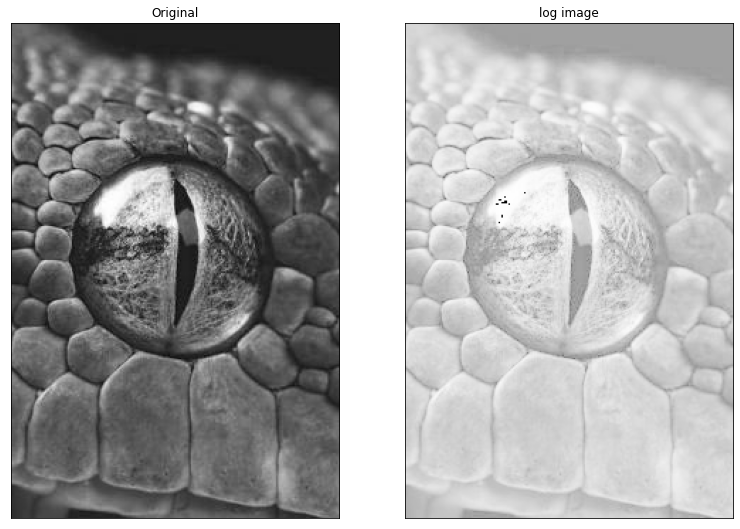

In [0]:
import cv2
import numpy as np

img= cv2.imread("/content/drive/My Drive/Procesamiento de imagen/IMAGENES/ojo.jpg")
img_log = (np.log(img+1)/(np.log(1+np.max(img))))*255
img_log = np.array(img_log,dtype=np.uint8)
displayGray2(img,img_log, 'Original' , 'log image')

**GAMA ALTA Y GAMA BAJA**

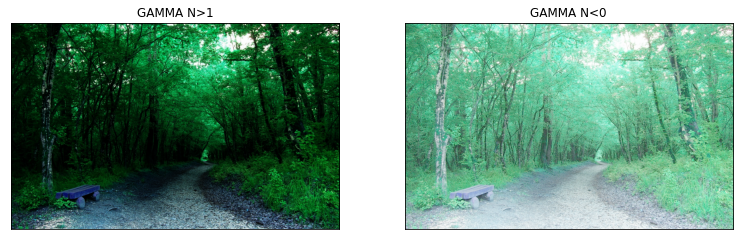

In [0]:
img= cv2.imread("/content/drive/My Drive/Procesamiento de imagen/IMAGENES/arbol.jpg")
gamma_two_point_two = np.array(255*(img/255)**2.2, dtype='uint8') #doble asterisco es elevado
gamma_point_four = np.array(255*(img/255)**0.4, dtype='uint8')
displayGray2(gamma_two_point_two, gamma_point_four , 'GAMMA N>1', 'GAMMA N<0')

**NEGATIVO Y NEGRO (INVERSION)**

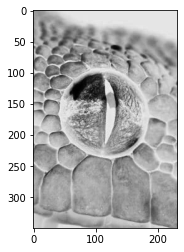

In [0]:
from PIL import Image

img=cv2.imread("/content/drive/My Drive/Procesamiento de imagen/IMAGENES/ojo.jpg",0)
cv2.imwrite("ojo2.jpg",img)

foto= Image.open('ojo2.jpg')

datos= foto.getdata()

datos_invertidos=[255- x for x in datos]

imagen_invertida= Image.new('L', foto.size)

imagen_invertida.putdata(datos_invertidos)

#Imagen_invertida.save('ruta_y_nombre_del_archivo)
plt.imshow(np.asarray(imagen_invertida), cmap= 'gray')

**INVERTIDO RGB**

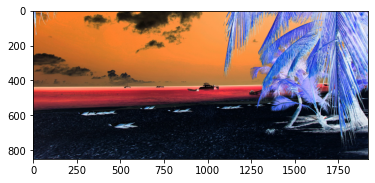

In [0]:
from PIL import Image


foto= Image.open("/content/drive/My Drive/Procesamiento de imagen/IMAGENES/playa.jpeg")

datos= list(foto.getdata())

datos_invertidos=[(255-datos[x][0], 255 - datos[x][1],255-datos[x][2]) for x in range(len(datos))]

imagen_invertida= Image.new('RGB', foto.size)

imagen_invertida.putdata(datos_invertidos)

#Imagen_invertida.save('ruta_y_nombre_del_archivo)
plt.imshow(np.asarray(imagen_invertida))

**BINARIZACION (invertida)**

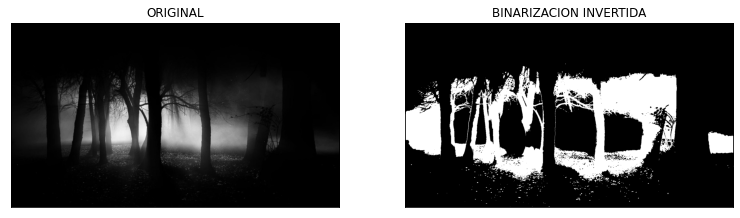

In [0]:
def binarizacion(img,minr=10,maxr=60):
  img=cv2.imread("/content/drive/My Drive/Procesamiento de imagen/IMAGENES/noche.jpg",0)
  row, column= img.shape
  img1= np.zeros((row,column),dtype= 'uint8')

  min_range= minr
  max_range= maxr

  for i in range(row):
    for j in range(column):
        if img[i,j]>min_range and img[i,j]<max_range:
          img1[i,j]= 255
        else:
          img1[i,j]=0

  displayGray2(img,img1,"ORIGINAL","BINARIZACION INVERTIDA")

binarizacion(img,10,60)

**FRACCIONAMIENTO DE NIVEL DE GRISE**

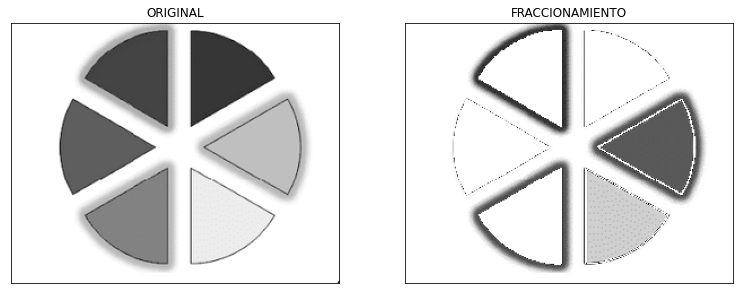

In [0]:
def fraccionamiento(img,minr=10,maxr=60):
  img=cv2.imread("/content/drive/My Drive/Procesamiento de imagen/IMAGENES/pastel.png",0)
  row, column= img.shape
  img2= np.zeros((row,column),dtype= 'uint8')

  a= minr
  b= maxr

  for x in range(0,row):
    for y in range(0,column):
        r=img[x][y]
        if a<=r and r<=b:
          img2[x][y]= 255
        else:
          img2[x][y]=img[x][y]

  displayGray2(img,img2,"ORIGINAL","FRACCIONAMIENTO")

fraccionamiento(img,0,155)

**THRESHOLD**


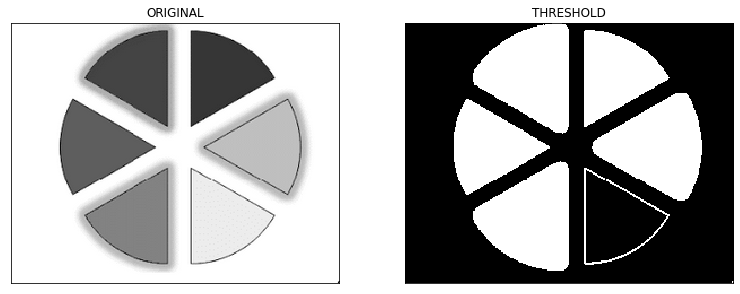

In [0]:
def threshold(img,thres):
  img=cv2.imread("/content/drive/My Drive/Procesamiento de imagen/IMAGENES/pastel.png",0)
  row, column= img.shape
  img2= np.zeros((row,column),dtype= 'uint8')

  T= thres

  for x in range(0,row):
    for y in range(0,column):
        r=img[x][y]
        if T<=r:
          img2[x][y]= 0
        else:
          img2[x][y]=255

  displayGray2(img,img2,"ORIGINAL","THRESHOLD")
  return
threshold(img,220)

**TRANSFORMACION LINEAL POR TRAMOS**

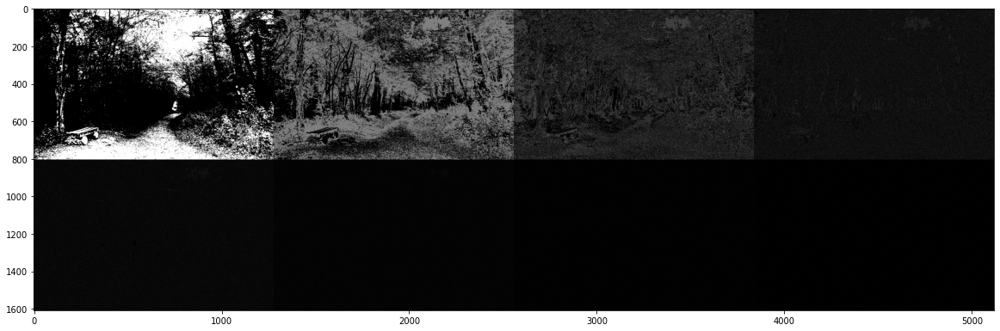

In [0]:

img= cv2.imread("/content/drive/My Drive/Procesamiento de imagen/IMAGENES/arbol.jpg",0)


list= []
for i in range(img.shape[0]):
  for j in range(img.shape[1]):
    list.append(np.binary_repr(img[i][j], width=8)) #width = no. of bits

otto_bit_img=(np.array([int(i[0]) for i in list],dtype= np.uint8)*128).reshape(img.shape[0],img.shape[1])
sette_bit_img=(np.array([int(i[1]) for i in list],dtype= np.uint8)*64).reshape(img.shape[0],img.shape[1])
sei_bit_img=(np.array([int(i[2]) for i in list],dtype= np.uint8)*32).reshape(img.shape[0],img.shape[1])
cinque_bit_img=(np.array([int(i[3]) for i in list],dtype= np.uint8)*16).reshape(img.shape[0],img.shape[1])
quattro_bit_img=(np.array([int(i[4]) for i in list],dtype= np.uint8)*8).reshape(img.shape[0],img.shape[1])
tre_bit_img=(np.array([int(i[5]) for i in list],dtype= np.uint8)*4).reshape(img.shape[0],img.shape[1])
due_bit_img=(np.array([int(i[6]) for i in list],dtype= np.uint8)*2).reshape(img.shape[0],img.shape[1])
uno_bit_img=(np.array([int(i[7]) for i in list],dtype= np.uint8)*1).reshape(img.shape[0],img.shape[1])

finalr= cv2.hconcat([otto_bit_img,sette_bit_img,sei_bit_img,cinque_bit_img])
finalv= cv2.hconcat([quattro_bit_img,tre_bit_img,due_bit_img,uno_bit_img])

final= cv2.vconcat([finalr,finalv])
plt.figure(figsize=(20,20))
plt.imshow(final, cmap='gray')


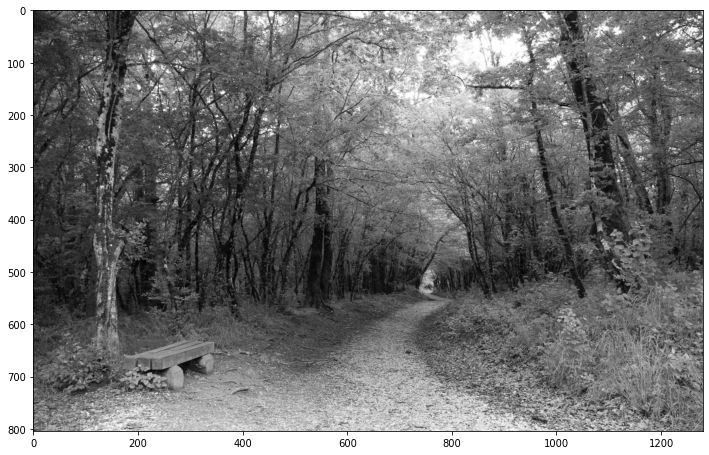

In [0]:
new_img= otto_bit_img+sette_bit_img+sei_bit_img+cinque_bit_img+quattro_bit_img+tre_bit_img+due_bit_img+uno_bit_img
plt.figure(figsize=(12,12))
plt.imshow(new_img, cmap='gray')

# **HISTOGRAMA Y EQUIALIZACION**

**FUNCIONES**

In [0]:
def readRGB(imgPath):
    img = cv2.imread(imgPath)
    img =cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
    return img

**HISTOGRAMA MUCHO BRILLO**

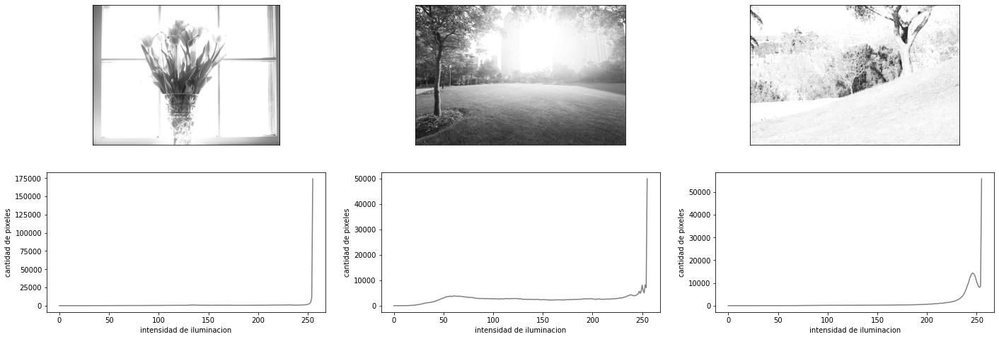

In [0]:
img = cv2.imread('flores_grupo1.jpg', cv2.IMREAD_GRAYSCALE)
hist = cv2.calcHist([img], [0], None, [256], [0, 256])

img2 = cv2.imread('exterior_grupo1.jpg', cv2.IMREAD_GRAYSCALE)
hist2 = cv2.calcHist([img2], [0], None, [256], [0, 256])

img3 = cv2.imread('exterior2_grupo1.jpg', cv2.IMREAD_GRAYSCALE)
hist3 = cv2.calcHist([img3], [0], None, [256], [0, 256])

plt.figure(figsize=(24,8))
plt.subplot(231), plt.imshow(img,cmap='gray')
plt.xticks([]), plt.yticks([])
plt.subplot(232), plt.imshow(img2,cmap='gray')
plt.xticks([]), plt.yticks([])
plt.subplot(233), plt.imshow(img3,cmap='gray')
plt.xticks([]), plt.yticks([])

plt.subplot(234), plt.plot(hist, color='gray' )
plt.xlabel('intensidad de iluminacion')
plt.ylabel('cantidad de pixeles')
plt.subplot(235), plt.plot(hist2, color='gray' )
plt.xlabel('intensidad de iluminacion')
plt.ylabel('cantidad de pixeles')
plt.subplot(236), plt.plot(hist3, color='gray' )
plt.xlabel('intensidad de iluminacion')
plt.ylabel('cantidad de pixeles')
plt.show()

**EQUALIZACION MUCHO BRILLO**

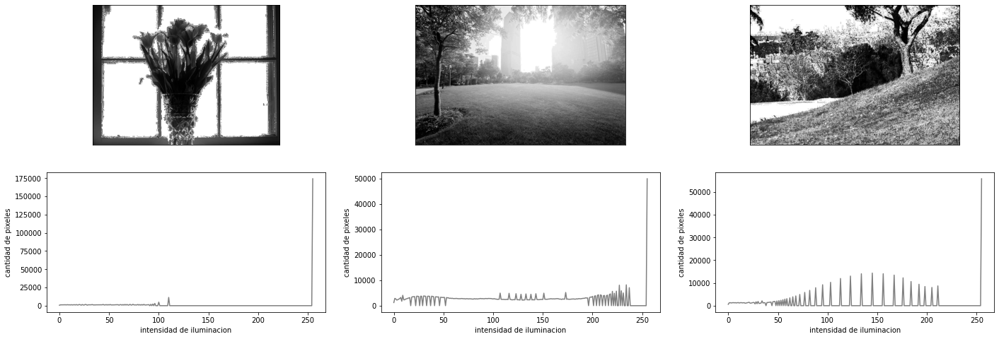

In [0]:
img = cv2.imread('flores_grupo1.jpg', cv2.IMREAD_GRAYSCALE)
img = cv2.equalizeHist(img)
hist = cv2.calcHist([img], [0], None, [256], [0, 256])

img2 = cv2.imread('exterior_grupo1.jpg', cv2.IMREAD_GRAYSCALE)
img2 = cv2.equalizeHist(img2)
hist2 = cv2.calcHist([img2], [0], None, [256], [0, 256])

img3 = cv2.imread('exterior2_grupo1.jpg', cv2.IMREAD_GRAYSCALE)
img3 = cv2.equalizeHist(img3)
hist3 = cv2.calcHist([img3], [0], None, [256], [0, 256])


plt.figure(figsize=(24,8))
plt.subplot(231), plt.imshow(img,cmap='gray')
plt.xticks([]), plt.yticks([])
plt.subplot(232), plt.imshow(img2,cmap='gray')
plt.xticks([]), plt.yticks([])
plt.subplot(233), plt.imshow(img3,cmap='gray')
plt.xticks([]), plt.yticks([])

plt.subplot(234), plt.plot(hist, color='gray' )
plt.xlabel('intensidad de iluminacion')
plt.ylabel('cantidad de pixeles')
plt.subplot(235), plt.plot(hist2, color='gray' )
plt.xlabel('intensidad de iluminacion')
plt.ylabel('cantidad de pixeles')
plt.subplot(236), plt.plot(hist3, color='gray' )
plt.xlabel('intensidad de iluminacion')
plt.ylabel('cantidad de pixeles')
plt.show()

**HISTOGRAMA A COLOR**

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:11: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  # This is added back by InteractiveShellApp.init_path()
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:11: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  # This is added back by InteractiveShellApp.init_path()


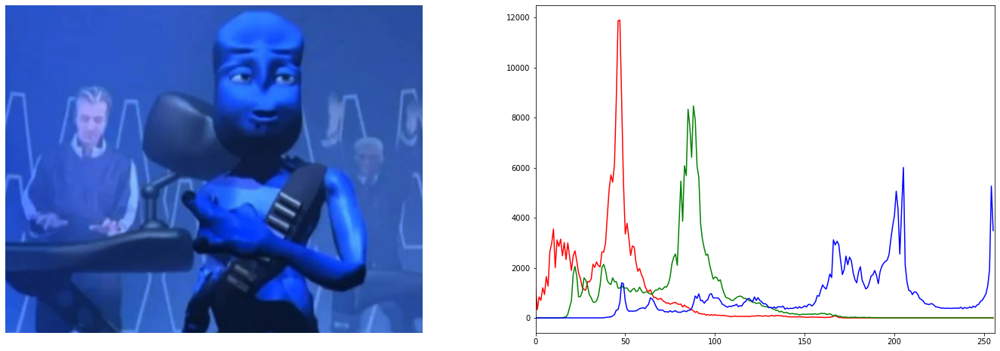

In [0]:
img = readRGB('unnamed.png')
color = ('r','g','b')

plt.figure(figsize=(24,8))
plt.subplot(1,2,1), plt.imshow(img)
plt.axis("off")


for i, c in enumerate(color):
    hist = cv2.calcHist([img], [i], None, [256], [0, 256])
    plt.subplot(1,2,2),plt.plot(hist, color = c)
    plt.xlim([0,256])
    

plt.show()

**HISTOGRAMA A COLOR MUY ILUMINADA**

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:11: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  # This is added back by InteractiveShellApp.init_path()
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:11: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  # This is added back by InteractiveShellApp.init_path()


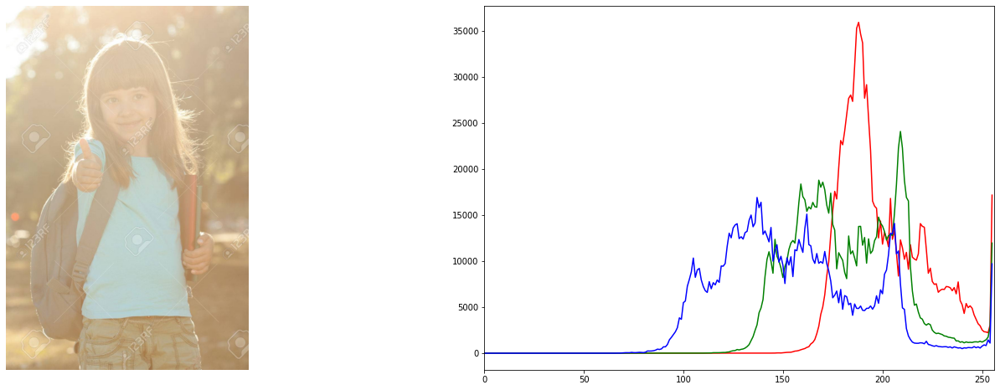

In [0]:
img = readRGB('niña_grupo3.jpg')
color = ('r','g','b')

plt.figure(figsize=(24,8))
plt.subplot(1,2,1), plt.imshow(img)
plt.axis("off")


for i, c in enumerate(color):
    hist = cv2.calcHist([img], [i], None, [256], [0, 256])
    plt.subplot(1,2,2),plt.plot(hist, color = c)
    plt.xlim([0,256])
    

plt.show()

**IMAGEN ILUMINADA EQUIALIZADA COLOR**

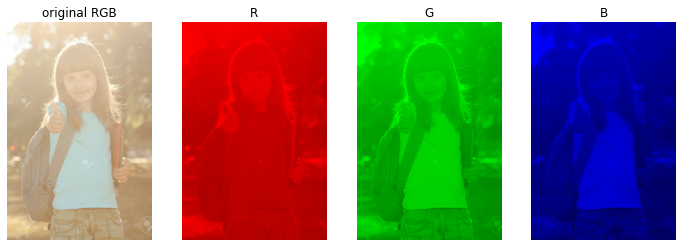

In [0]:

img = readRGB('niña_grupo3.jpg')

count = 2
plt.figure(figsize=(12,4))
plt.subplot(1,4,1), plt.imshow(img/255.0), plt.title("original RGB")    
plt.axis("off")
for i, lab in enumerate(["R","G","B"]):
    crgb = np.zeros(img.shape)
    crgb[:,:,i] = img[:,:,i]
    plt.subplot(1,4,count), plt.imshow(crgb/255.0), plt.title(lab) 
    plt.axis("off")
    count += 1
    
plt.show()



**HISTOGRAMA EN LA MASCARA**

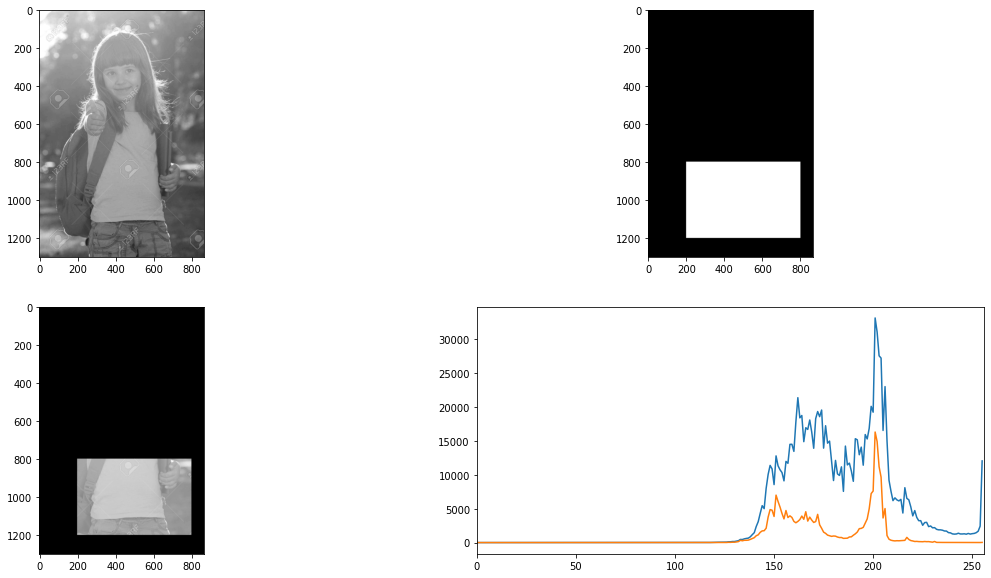

In [0]:
img = cv2.imread('niña_grupo3.jpg',0)

# crear mascara
mask = np.zeros(img.shape[:2], np.uint8)
mask[800:1200, 200:800] = 255
masked_img = cv2.bitwise_and(img,img,mask = mask)

# Calcular histograma con y sin mascara
hist_full = cv2.calcHist([img],[0],None,[256],[0,256])
hist_mask = cv2.calcHist([img],[0],mask,[256],[0,256])

plt.figure(figsize=(20,10))
plt.subplot(221), plt.imshow(img, 'gray')
plt.subplot(222), plt.imshow(mask,'gray')
plt.subplot(223), plt.imshow(masked_img, 'gray')
plt.subplot(224), plt.plot(hist_full), plt.plot(hist_mask)
plt.xlim([0,256])

plt.show()

# **TRANSLACION,ROTACION,ESCALAMIENTO Y SKEW**

**TRANSLACION**

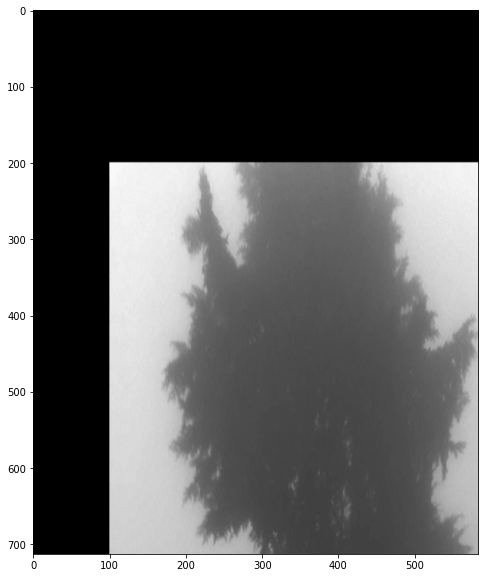

In [0]:
img= cv2.imread('arbol_grupo3.jpg',0)
rows,cols = img.shape

M = np.float32([[1,0,100],[0,2,200]])
dst = cv2.warpAffine(img, M,(cols,rows))

plt.figure(figsize=(10,10))
plt.imshow(dst, cmap='gray')

**ESCALAMIENTO**

Antes del escalado:  713 584
Despues del escalado:  2852 2336


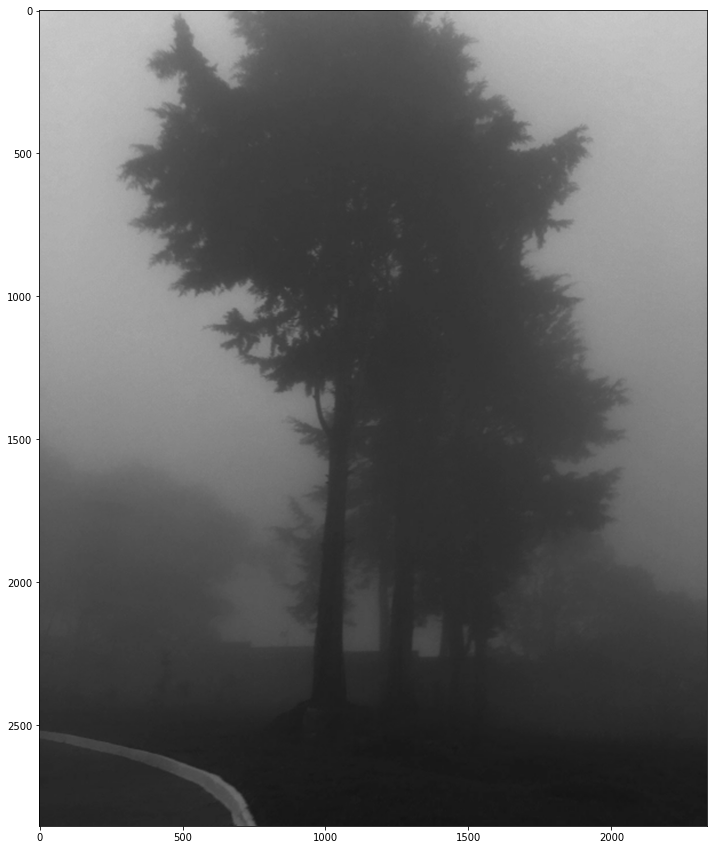

In [0]:
 img = cv2.imread('arbol_grupo3.jpg',0)
 img= cv2.cvtColor(img,cv2.COLOR_BGR2RGB)

 res= cv2.resize(img,None,fx=2, fy=2, interpolation = cv2.INTER_CUBIC)

 #OR

 height, width = img.shape[:2]
 print("Antes del escalado: ",height, width)
 res=cv2.resize(img,(4*width, 4*height), interpolation = cv2.INTER_CUBIC)
 height, width = res.shape[:2]
 print("Despues del escalado: ",height,width)
 fig1=plt.figure(figsize=(15,15))
 plt.imshow(res)
 plt.show()


**ROTACION**

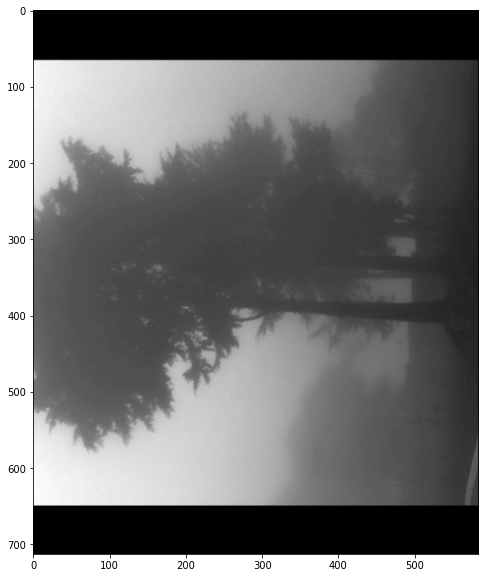

In [0]:
img= cv2.imread('arbol_grupo3.jpg',0)
rows,cols= img.shape

M = cv2.getRotationMatrix2D((cols/2, rows/2),90,1)#(centro,angulo, escala) Se divide entre 2 el 
dst= cv2.warpAffine(img,M,(cols,rows))                                    #punto de rotacion para que quede en el centro de la imagen. 

plt.figure(figsize=(10,10))
plt.imshow(dst,cmap='gray')

**FLIP**

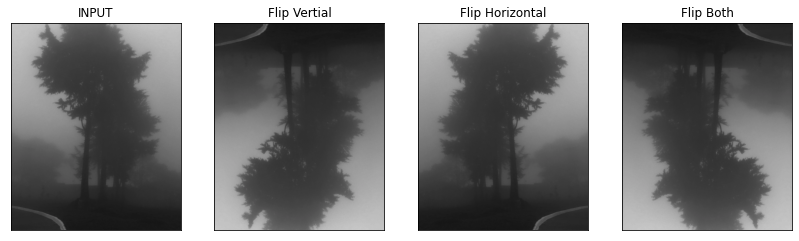

In [0]:
img= cv2.imread("arbol_grupo3.jpg",cv2.IMREAD_COLOR)
img= cv2.cvtColor(img,cv2.COLOR_BGR2RGB)

flipVertical = cv2.flip(img, 0)
flipHorizontal=cv2.flip(img,1)
flipBoth= cv2.flip(img, -1)

plt.figure(figsize=(14,14))
plt.subplot(141), plt.imshow(img),plt.title("INPUT")
plt.xticks([]), plt.yticks([])
plt.subplot(142), plt.imshow(flipVertical), plt.title("Flip Vertial")
plt.xticks([]), plt.yticks([])
plt.subplot(143), plt.imshow(flipHorizontal),plt.title("Flip Horizontal")
plt.xticks([]), plt.yticks([])
plt.subplot(144), plt.imshow(flipBoth), plt.title("Flip Both")
plt.xticks([]), plt.yticks([])
plt.show()





**PERSPECTIVA**

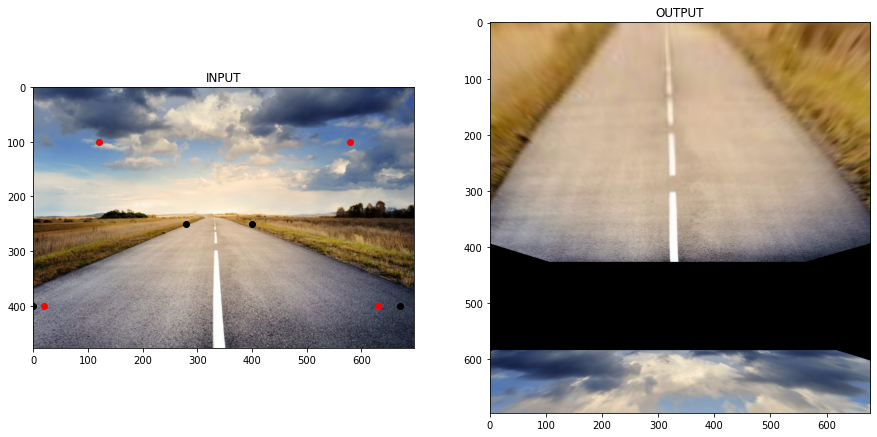

In [10]:
img= cv2.imread('Carretera.jpg',cv2.IMREAD_COLOR)
img=cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
rows,cols,ch=img.shape
                  #X   Y
pts1=np.float32([[280,250],[400,250],[0,400],[670,400]]) #PUNTOS NEGROS
pts2=np.float32([[120,100],[580,100],[20,400],[630,400]]) #PUNTOS ROJOS
xE=[280,400,0,670]
yE=[250,250,400,400]
xS=[120,580,20,630]
yS=[100,100,400,400]

M=cv2.getPerspectiveTransform(pts1,pts2)

dst= cv2.warpPerspective(img,M,(rows+200,cols))

plt.figure(figsize=(15,15))
plt.subplot(121)
plt.imshow(img)
plt.title('INPUT')
plt.scatter(xE,yE,color='k')
plt.scatter(xS,yS,color='r')
plt.subplot(122)
plt.imshow(dst)
plt.title('OUTPUT')
plt.show()

**TRANSLACION Y ROTACION**

713 584


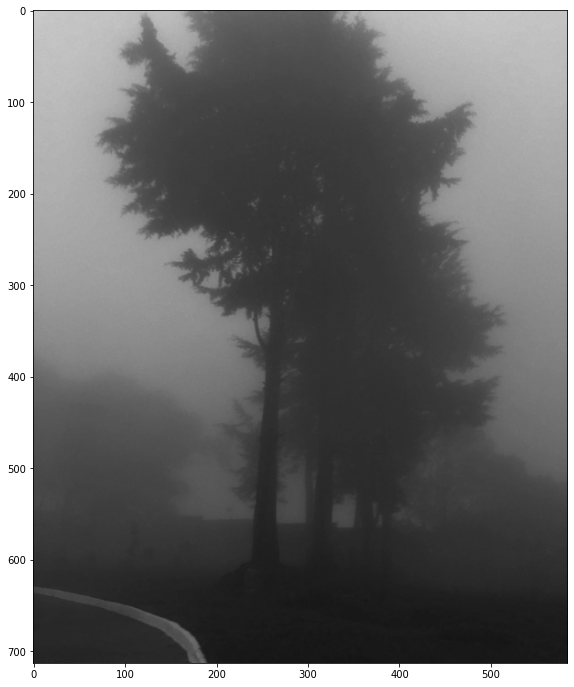

In [0]:
#@title Parametros Transformacion {run:"auto"}
img_BGR = cv2.imread('arbol_grupo3.jpg',cv2.IMREAD_COLOR)
img_RGB= cv2.cvtColor(img_BGR,cv2.COLOR_BGR2RGB)
Grados = 0 #@param {type:"slider", min:0, max:360, step:5}
X=0 #@param {type:"slider",min:-250,max:2000,step:2}
Y=0 #@param {type:"slider", min:-100,max:2500,step:2}
#We can also play around with rotations by definig our M matrix,

"""
  cos(theta)  -sin(theta) tx
  sin(theta)   cos(theta) ty
""" 

rows,cols,_ = img_RGB.shape
print(rows,cols)
radians= Grados*np.pi/100
M= [
     [np.cos(radians), -np.sin(radians), X],
     [np.sin(radians), np.cos(radians), Y]
   ]

M=np.array(M)
rows += int(X)
cols += int(Y)
res= cv2.warpAffine(img_RGB, M, (cols,rows))
plt.figure(figsize=(12,12))
plt.imshow(res)
plt.show()

**tRANSFORMACIÓN AFIN**

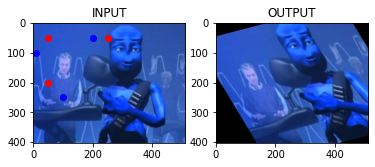

In [11]:
img= cv2.imread('unnamed.png')
img= cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
rows,cols,ch = img.shape

                  #X   Y
pts1=np.float32([[50,50],[250,50],[50,200]]) #PUNTOS NEGROS
pts2=np.float32([[10,100],[200,50],[100,250]]) #PUNTOS ROJOS
xE=[50,250,50]
yE=[50,50,200]
xS=[10,200,100]
yS=[100,50,250]

M = cv2.getAffineTransform(pts1,pts2)

dst= cv2.warpAffine(img,M,(cols,rows))

plt.subplot(121)
plt.imshow(img)
plt.title('INPUT')
plt.scatter(xE,yE,color='r')
plt.scatter(xS,yS,color='b')
plt.subplot(122)
plt.imshow(dst)
plt.title('OUTPUT')
plt.show()